# 꽃 분류기 만들기

## 최종 정확도: 81.25

회고

먼저 이미지 크기는 160x160으로 통일하여 직접 모델을 만들어보고 성능을 확인해봤다.
그러나 성능은 56.25%가 나왔다.
다음으로 VGG16을 사용하여 분류기를 만들어보았다.
최종적으로 81.25%가 나와서 나름 만족스러운 결과였다.

1. 데이터 불러오기

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

In [3]:
import tensorflow as tf
print(tf.__version__)

2.6.0


In [4]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [9]:
import pathlib
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
archive = tf.keras.utils.get_file(origin=dataset_url, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')

228827136/228813984 [==============================] - 1s 0us/step


In [11]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


In [13]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='./content',
    download=True,
    with_info=True,
    as_supervised=True,
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to ./content/tf_flowers/3.0.1. Subsequent calls will reuse this data.


2. 데이터 다듬기

In [14]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

In [25]:
print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


In [50]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


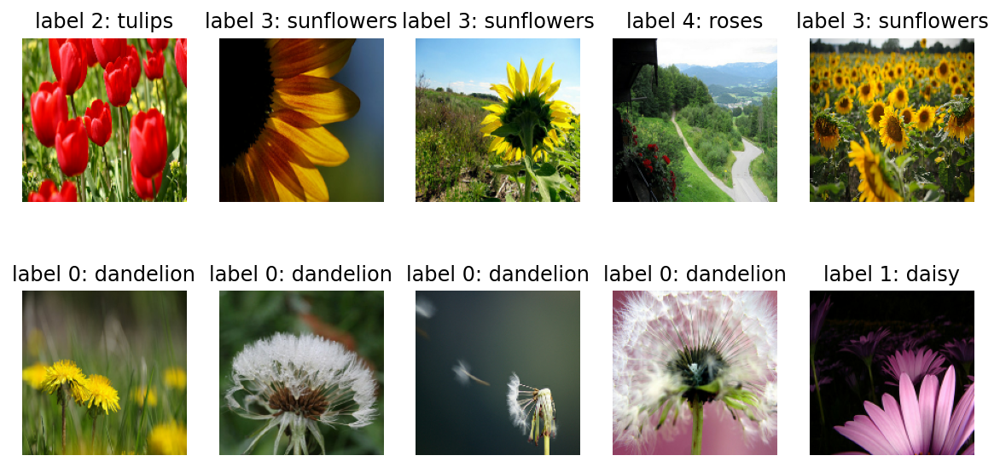

In [52]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

3. 모델 만들기

In [53]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [54]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

print("슝~")

# Conv2D, MaxPooling2D, Flatten, Dense라는 네가지 종류의 레이어 사용

슝~


In [55]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 25600)            

4. compoile 후 학습시키기

In [56]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [57]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [58]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [59]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [60]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 1.6054 - accuracy: 0.2358WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 0s 8ms/step - loss: 1.6037 - accuracy: 0.2371
initial loss: 1.60
initial accuracy: 0.24


In [61]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 4s 32ms/step - loss: 1.4014 - accuracy: 0.3968 - val_loss: 1.2636 - val_accuracy: 0.4469
Epoch 2/10
92/92 [==============================] - 3s 30ms/step - loss: 1.0750 - accuracy: 0.5651 - val_loss: 1.0846 - val_accuracy: 0.5450
Epoch 3/10
92/92 [==============================] - 3s 30ms/step - loss: 0.9513 - accuracy: 0.6250 - val_loss: 1.0204 - val_accuracy: 0.6049
Epoch 4/10
92/92 [==============================] - 3s 30ms/step - loss: 0.8591 - accuracy: 0.6686 - val_loss: 0.9817 - val_accuracy: 0.6240
Epoch 5/10
92/92 [==============================] - 3s 30ms/step - loss: 0.7483 - accuracy: 0.7204 - val_loss: 0.9652 - val_accuracy: 0.6403
Epoch 6/10
92/92 [==============================] - 3s 29ms/step - loss: 0.6751 - accuracy: 0.7517 - val_loss: 0.9416 - val_accuracy: 0.6403
Epoch 7/10
92/92 [==============================] - 3s 29ms/step - loss: 0.5927 - accuracy: 0.7885 - val_loss: 1.1058 - val_accuracy: 0.5559
Epoch 8/10
92

5. 모델 성능 확인하기

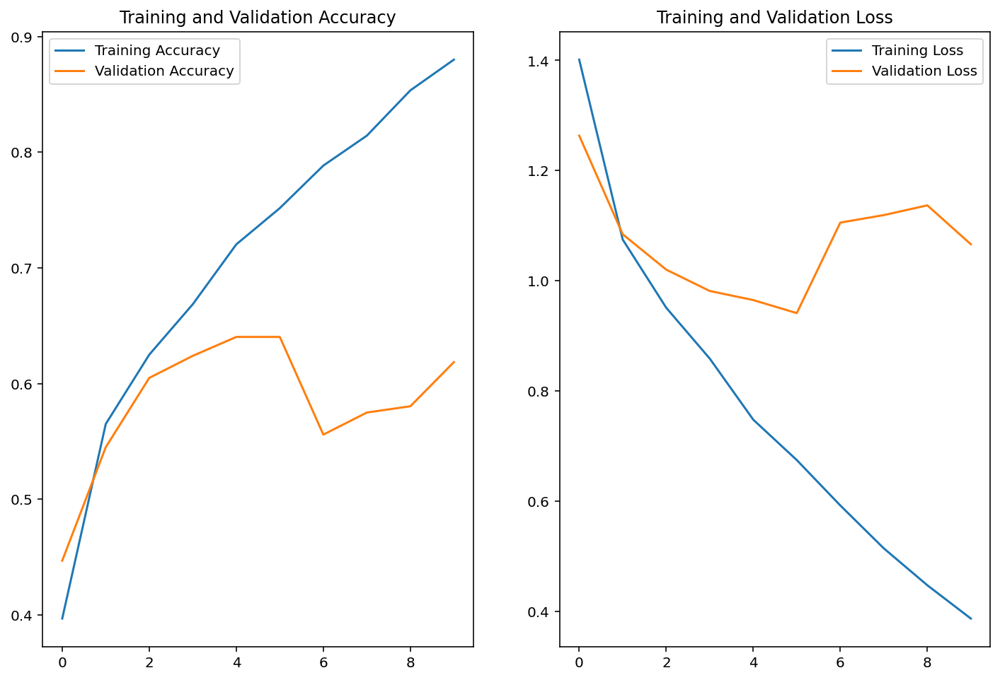

In [62]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [63]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[2.39857123e-03, 3.15580443e-02, 8.33735466e-02, 5.11358559e-01,
        3.71311218e-01],
       [7.04915583e-01, 2.91904151e-01, 7.23122910e-04, 4.02341102e-05,
        2.41697463e-03],
       [7.88798571e-01, 8.06533620e-02, 2.59638466e-02, 1.00825727e-01,
        3.75846541e-03],
       [9.91799235e-02, 4.18902457e-01, 1.51847139e-01, 2.44253455e-03,
        3.27627987e-01],
       [7.41012752e-01, 1.20054848e-01, 1.93000641e-02, 5.04534179e-03,
        1.14586964e-01],
       [2.61163682e-01, 4.77245331e-01, 1.77214015e-02, 3.37570906e-02,
        2.10112467e-01],
       [2.25051842e-03, 1.44458696e-01, 6.24368072e-01, 6.01974316e-03,
        2.22902969e-01],
       [2.84283534e-02, 3.85366589e-01, 4.52949218e-02, 3.41530442e-02,
        5.06757081e-01],
       [2.66549457e-02, 3.69276153e-04, 2.00672331e-03, 9.70755041e-01,
        2.13974330e-04],
       [9.85170782e-01, 1.40751051e-02, 3.17518898e-05, 8.52064568e-06,
        7.13758753e-04],
       [9.67185974e-01, 2.7234

In [64]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 0, 1, 0, 1, 2, 4, 3, 0, 0, 3, 3, 4, 4, 3, 2, 0, 1, 4, 2, 1,
       1, 0, 1, 1, 4, 1, 4, 1, 0, 0])

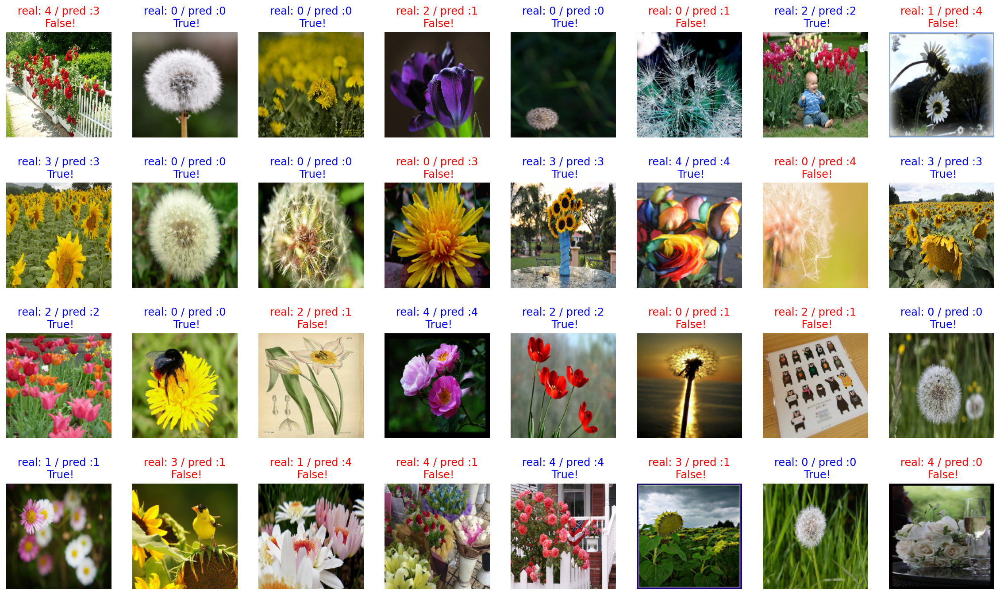

In [65]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [66]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)

56.25


(7) VGG16 가져오기

In [67]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [68]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [69]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [70]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

(8) VGG16으로 원하는 구조의 분류 모델 만들기

In [72]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [73]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [74]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [75]:
dense_layer = tf.keras.layers.Dense(feature_batch_average.shape[-1], activation='relu')

prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [76]:
base_model.trainable = False
print("슝~")

슝~


최종모델

In [77]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [78]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


(9) compile 학습

In [79]:
base_learning_rate = 0.0001
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    metrics=['accuracy']
)

print("슝~")

슝~


In [80]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 2s - loss: 1.7942 - accuracy: 0.2452WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 7s 152ms/step - loss: 1.7942 - accuracy: 0.2452
initial loss: 1.79
initial accuracy: 0.25


In [81]:
EPOCHS = 5
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 12s 116ms/step - loss: 1.3502 - accuracy: 0.5439 - val_loss: 1.1250 - val_accuracy: 0.6267
Epoch 2/5
92/92 [==============================] - 8s 85ms/step - loss: 1.0196 - accuracy: 0.6989 - val_loss: 0.9022 - val_accuracy: 0.7112
Epoch 3/5
92/92 [==============================] - 8s 84ms/step - loss: 0.8479 - accuracy: 0.7415 - val_loss: 0.7858 - val_accuracy: 0.7248
Epoch 4/5
92/92 [==============================] - 8s 83ms/step - loss: 0.7486 - accuracy: 0.7650 - val_loss: 0.7026 - val_accuracy: 0.7466
Epoch 5/5
92/92 [==============================] - 8s 82ms/step - loss: 0.6805 - accuracy: 0.7837 - val_loss: 0.6779 - val_accuracy: 0.7629


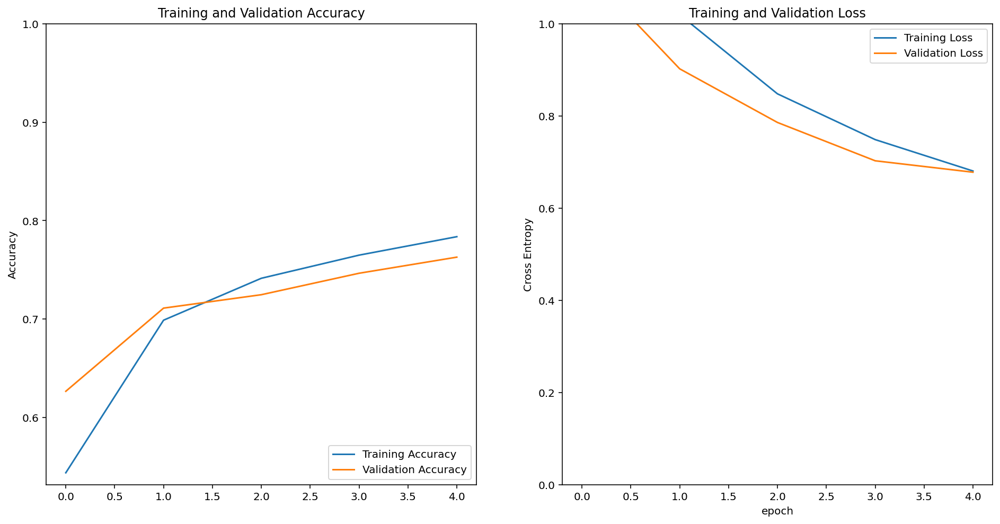

In [82]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [83]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[6.10717162e-02, 1.05872378e-01, 4.44007605e-01, 1.90455899e-01,
        1.98592409e-01],
       [9.93842602e-01, 2.57264194e-03, 2.42588532e-04, 2.40430213e-03,
        9.37897479e-04],
       [6.66260242e-01, 1.22322150e-01, 3.70181724e-02, 1.35674775e-01,
        3.87246162e-02],
       [9.79667623e-03, 4.56742868e-02, 3.78813595e-01, 3.40942964e-02,
        5.31621099e-01],
       [6.29570425e-01, 2.28954509e-01, 3.52055542e-02, 5.21288514e-02,
        5.41406162e-02],
       [8.39789450e-01, 6.84904158e-02, 1.87589191e-02, 6.28229156e-02,
        1.01383468e-02],
       [2.96436790e-02, 3.42661440e-02, 4.95627284e-01, 2.89559841e-01,
        1.50903061e-01],
       [2.76116908e-01, 2.65052497e-01, 1.00483689e-02, 4.15778369e-01,
        3.30039375e-02],
       [3.97905894e-02, 1.56425945e-02, 5.19390292e-02, 7.21006513e-01,
        1.71621263e-01],
       [9.97307420e-01, 1.05541933e-03, 3.84792220e-05, 1.51704508e-03,
        8.16505271e-05],
       [9.44961548e-01, 2.5313

In [84]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 4, 0, 0, 2, 3, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 1, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

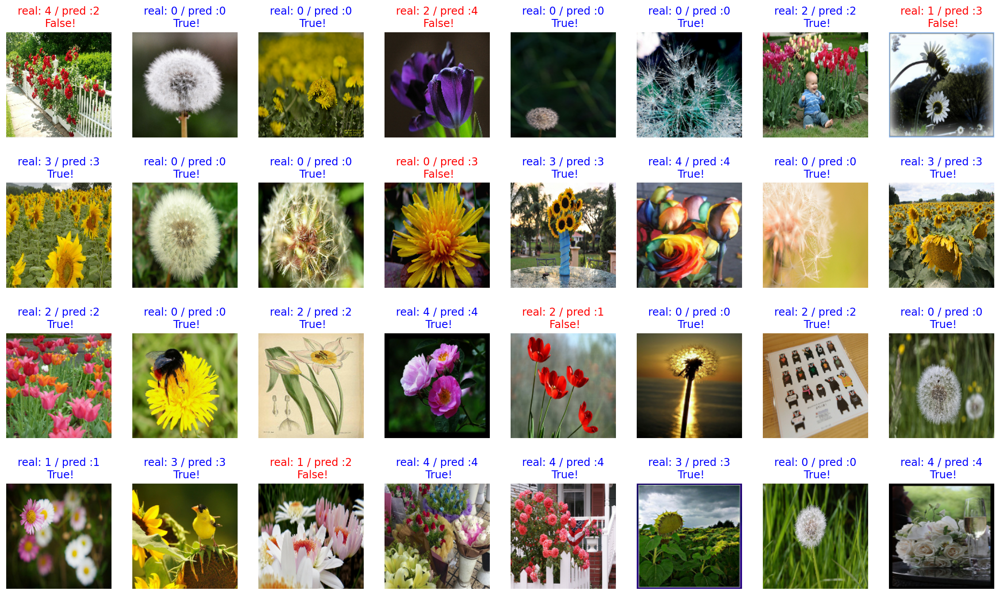

In [85]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [86]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

81.25
